In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import os
from pathlib import Path

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

import torch
from diffusers import StableDiffusionPipeline

from tqdm import tqdm

In [4]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [26]:
CONCEPT = 'dog'
PROMPT = f"a photo of a {CONCEPT}"
SEED_BASE = 1000
NUM_IMAGES_PER_PROMPT = 100
TARGET_BLOCK = 'up_blocks.1.attentions.1.transformer_blocks.0.ff.net.0'
# TARGET_BLOCK = 'mid_block.attentions.0.transformer_blocks.0.ff.net.0'
NUM_INFERENCE_STEPS = 50
CAPTURE_STEP = 10
GUIDANCE_SCALE = 7.5
NEGATIVE_PROMPT = ""
TOP_K = 100
ETA = 0.0

In [27]:
if "pipe" not in globals():
    pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
    pipe = pipe.to(DEVICE)
    pipe.safety_checker = None
    pipe.set_progress_bar_config(disable=True)

In [28]:
# 타겟 블록 탐색
def get_target_block(unet, target_block_name: str):
    parts = target_block_name.split(".")
    def resolve(obj, remaining):
        if not remaining:
            return obj
        part, *rest = remaining
        child = obj[int(part)] if part.isdigit() else getattr(obj, part)
        return resolve(child, rest)
    return resolve(unet, parts)


# 배치 조건 확인
def _tensor_cond_batch_slice(t: torch.Tensor) -> torch.Tensor:
    if t.dim() >= 1 and t.shape[0] >= 2:
        return t[1]
    return t[0]

def _capture_activation(x):
    if isinstance(x, torch.Tensor):
        return _tensor_cond_batch_slice(x).clone().detach().cpu()
    if isinstance(x, (tuple, list)):
        tensors = [
            _tensor_cond_batch_slice(t).clone().detach().cpu()
            for t in x
            if isinstance(t, torch.Tensor)
        ]
        if len(tensors) == 1:
            return tensors[0]
        return tensors
    return x


# 특정 step에서 activation input/output 저장 - 일단 input만 사용할거야
def make_forward_activation_hook_at_step(capture_step: int):
    state = {"forward_i": -1, "value": None}
    
    def hook(module, input, output):
        state["forward_i"] += 1
        if state["forward_i"] != capture_step:
            return
        state["value"] = {
            "input": _capture_activation(input),
            "output": _capture_activation(output),
        }

    return hook, state

In [29]:
import json
from datetime import datetime, timezone

# 저장을 위한 ~
def save_capture_run(
    images,
    activations_per_image,
    block_name: str,
    save_dir: Path,
    *,
    meta: dict | None = None,
) -> Path:
    save_dir = Path(save_dir)
    save_dir.mkdir(parents=True, exist_ok=True)
    
    images_dir = save_dir / "images"
    images_dir.mkdir(exist_ok=True)

    block_dir = save_dir / block_name.replace(".", "_")
    block_dir.mkdir(exist_ok=True)

    meta = {
        "prompt": PROMPT,
        "negative_prompt": NEGATIVE_PROMPT,
        "seed_base": SEED_BASE,
        "num_images": len(images),
        "target_block": TARGET_BLOCK,
        "num_inference_steps": NUM_INFERENCE_STEPS,
        "capture_step": CAPTURE_STEP,
        "guidance_scale": GUIDANCE_SCALE,
        "saved_at": datetime.now(timezone.utc).isoformat(),
        **(meta or {}),
    }

    inputs_list, outputs_list = [], []
    for i, act in enumerate(activations_per_image):
        if act is None:
            raise ValueError(f"activations_per_image[{i}] is None")
        inputs_list.append(act["input"])
        outputs_list.append(act["output"])
        images[i].save(images_dir / f"{i:04d}.png")

    inputs_stacked = torch.stack(inputs_list)
    outputs_stacked = torch.stack(outputs_list)
    torch.save(
        {"inputs": inputs_stacked, "outputs": outputs_stacked},
        save_dir / block_name.replace(".", "_") /  "activations.pt",
    )
    with open(save_dir / block_name.replace(".", "_") / "meta.json", "w", encoding="utf-8") as f:
        json.dump(meta, f, indent=2, ensure_ascii=False)

    print(f"saved → {save_dir}")
    print(f"  images: {len(images)} files in {images_dir}")
    print(f"  activations: {inputs_stacked.shape}, {outputs_stacked.shape}")
    return save_dir

def prompt_dir_name(prompt_idx: int, prompt: str) -> str:
    slug = prompt.lower().replace(" ", "_").replace("/", "_")[:40]
    return f"prompt_{prompt_idx:02d}_{slug}"

In [30]:
# generator = torch.Generator(device="cpu")

# unet = pipe.unet
# target_block = get_target_block(unet, TARGET_BLOCK)
# capture_hook, capture_state = make_forward_activation_hook_at_step(CAPTURE_STEP)
# hook_handle = target_block.register_forward_hook(capture_hook)

# images = []
# activations_per_image = []
# for i in tqdm(range(NUM_IMAGES_PER_PROMPT), desc="Generating images "):
#     generator.manual_seed(SEED_BASE+i)
#     capture_state["forward_i"] = -1
#     capture_state["value"] = None

#     result = pipe(
#         prompt=PROMPT,
#         negative_prompt=NEGATIVE_PROMPT,
#         num_inference_steps=NUM_INFERENCE_STEPS,
#         guidance_scale=GUIDANCE_SCALE,
#         num_images_per_prompt=1,
#         generator=generator,
#         output_type="pil",
#     )
#     if isinstance(result, dict):
#         img = result["images"][0]
#     else:
#         img = result.images[0]
#     images.append(img)
#     activations_per_image.append(capture_state["value"])

# hook_handle.remove()

In [31]:
# # save
# SAVE_DIR = Path(f"/project/dam/data/{CONCEPT}")
# save_capture_run(images, activations_per_image, TARGET_BLOCK.replace(".", "_"), SAVE_DIR)

# # inputs = torch.stack([act["input"] for act in activations_per_image])
# # inputs.shape

In [32]:
# load
SAVE_DIR = Path(f"/project/dam/data/{CONCEPT}")
images = [Image.open(SAVE_DIR / prompt_dir_name(0, PROMPT) / "images" / f"{i:04d}.png") for i in range(NUM_IMAGES_PER_PROMPT)]
inputs = torch.load(SAVE_DIR / prompt_dir_name(0, PROMPT) / TARGET_BLOCK.replace(".", "_") /  "activations.pt")['inputs'].cpu()
inputs.shape    

torch.Size([100, 256, 1280])

\begin{aligned}
&\text{직선의 방정식} \\
&w_1 x + w_2 y + b_i = 0 \\
&⇒ w_2 y = -(w_1 x + b_i) \\
&⇒ y = -\frac{w_1 x + b_i}{w_2}
\end{aligned}

In [33]:
# weight & bias 추출
ff = get_target_block(pipe.unet, TARGET_BLOCK)
ff_state = ff.state_dict()

W_geglu = ff_state["proj.weight"].cpu().float()   # (10240, 1280)
n_geglu_half = W_geglu.shape[0] // 2

W2 = W_geglu[n_geglu_half:]
b_geglu = ff_state["proj.bias"].cpu().float()
b2 = b_geglu[n_geglu_half:]

In [34]:
# inputs: (N, 256, 1280) — 이미지마다 mean_map·similarity·top-k를 각각 계산
N, seq_len, dim = inputs.shape
side = int(seq_len ** 0.5)
assert side * side == seq_len

K = 100 # 추출한 주요 뉴런 수

# (N, side, side, dim) → spatial mean → (N, seq_len)
h_3d = inputs.reshape(N, side, side, dim)
mean_map = h_3d.mean(dim=-1).reshape(N, seq_len)  # (N, 256)

# h: (N, 256, 1280) @ W2.T: (1280, 5120) → (N, 256, 5120)
neuron_acts = inputs @ W2.T

# spatial mean과의 유사도
similarity = (neuron_acts * mean_map.unsqueeze(-1)).sum(dim=1)  # (N, 5120)

similarity_mean = similarity.mean(dim=0)  # (5120,)
top_k_idx = similarity_mean.topk(K).indices  # 0~5119 범위

In [35]:
# w & b도 해당 뉴런들만 추출
W2_topk = W2[top_k_idx, :]
b2_topk = b2[top_k_idx]

print(W2_topk.shape, b2_topk.shape)

torch.Size([100, 1280]) torch.Size([100])


In [36]:
# 각 토큰이 hyperplane에서 얼마나 떨어져 있는지
signed_dist = inputs @ W2_topk.T
signed_dist = signed_dist + b2_topk
signed_dist = signed_dist / W2_topk.norm(dim=-1)

signed_dist.shape

torch.Size([100, 256, 100])

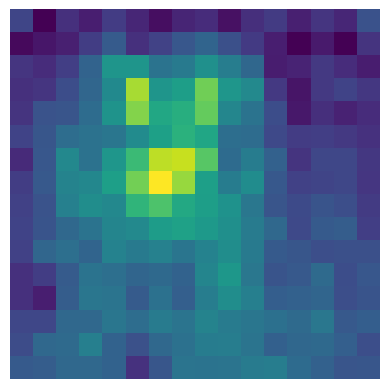

In [37]:
# 그냥 확인용
for i, img in enumerate(signed_dist[:, :, 0]):
    plt.imshow(img.reshape(side, side))
    plt.axis('off')
    plt.show()
    break

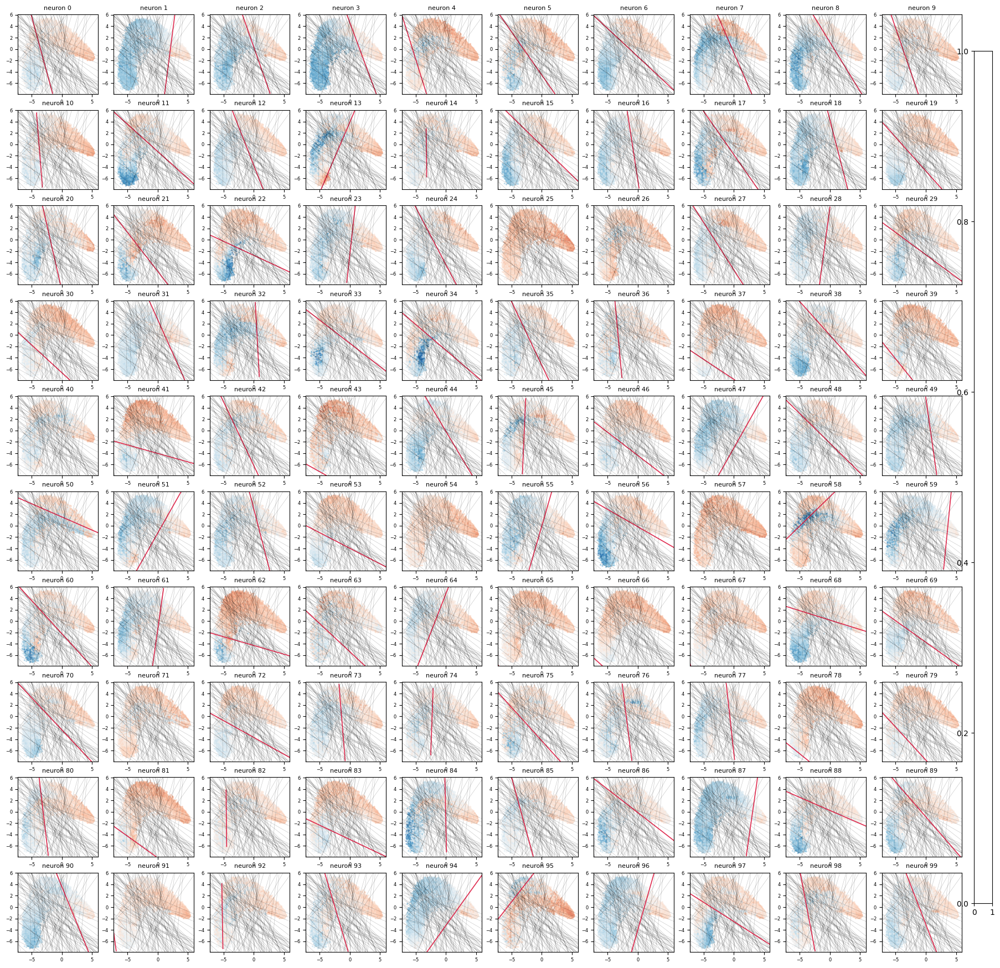

PCA explained variance: [0.14882834 0.05970821]
교점 수: 2685


In [38]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# 1. PCA
h_all = inputs.reshape(-1, inputs.shape[-1]).cpu().numpy()
pca_act = PCA(n_components=2)
h_2d = pca_act.fit_transform(h_all)

# 범주
x_min, x_max = h_2d[:, 0].min(), h_2d[:, 0].max()
y_min, y_max = h_2d[:, 1].min(), h_2d[:, 1].max()
pad = 0.05
x_lim = (x_min - pad*(x_max-x_min), x_max + pad*(x_max-x_min))
y_lim = (y_min - pad*(y_max-y_min), y_max + pad*(y_max-y_min))
x_range = np.linspace(x_lim[0], x_lim[1], 300)

# 2. w_j, b_j를 PCA 공간으로 변환
def to_2d(w_j, b_j):
    w_2d = pca_act.components_ @ w_j.cpu().numpy()
    b_2d = float(w_j.cpu().numpy() @ pca_act.mean_) + float(b_j)
    return w_2d, b_2d

# 3. 교점 계산
intersections = []
for i in range(K):
    for j in range(i+1, K):
        w_2d_i, b_2d_i = to_2d(W2_topk[i], b2_topk[i])
        w_2d_j, b_2d_j = to_2d(W2_topk[j], b2_topk[j])

        A = np.array([w_2d_i, w_2d_j])
        b = np.array([-b_2d_i, -b_2d_j])

        if abs(np.linalg.det(A)) < 1e-8:
            continue

        pt = np.linalg.solve(A, b)
        if x_lim[0] < pt[0] < x_lim[1] and y_lim[0] < pt[1] < y_lim[1]:
            intersections.append(pt)

intersections = np.array(intersections) if intersections else np.zeros((0, 2))

# 4. 시각화 — 뉴런 k마다
sd_flat = signed_dist.reshape(-1, K).cpu().numpy()

w_2d_all, b_2d_all = [], []
for j in range(K):
    w, b = to_2d(W2_topk[j], b2_topk[j])
    w_2d_all.append(w)
    b_2d_all.append(b)

ncols = 10
nrows = int(np.ceil(K / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(2.2 * ncols, 2.2 * nrows), squeeze=False)
axes_flat = axes.flatten()

def _plot_boundary(ax, w_2d, b_2d, *, lw=0.5, alpha=0.3, color='k'):
    if abs(w_2d[1]) < 1e-8:
        if abs(w_2d[0]) > 1e-8:
            x0 = -b_2d / w_2d[0]
            if x_lim[0] <= x0 <= x_lim[1]:
                ax.axvline(x0, color=color, lw=lw, alpha=alpha)
        return
    y_line = -(w_2d[0] * x_range + b_2d) / w_2d[1]
    mask = (y_line >= y_lim[0]) & (y_line <= y_lim[1])
    if mask.any():
        ax.plot(x_range[mask], y_line[mask], '-', color=color, lw=lw, alpha=alpha)

for k, ax in enumerate(axes_flat[:K]):
    sc = ax.scatter(
        h_2d[:, 0], h_2d[:, 1],
        c=sd_flat[:, k], cmap='RdBu', s=2, alpha=0.35, vmin=-3, vmax=3,
    )
    for j in range(K):
        if j == k:
            _plot_boundary(ax, w_2d_all[j], b_2d_all[j], lw=1.2, alpha=0.9, color='crimson')
        else:
            _plot_boundary(ax, w_2d_all[j], b_2d_all[j], lw=0.4, alpha=0.25, color='k')
    ax.set_xlim(x_lim)
    ax.set_ylim(y_lim)
    ax.set_title(f'neuron {k}', fontsize=8)
    ax.tick_params(labelsize=6)

for ax in axes_flat[K:]:
    ax.axis('off')

# fig.suptitle(f'Decision boundaries per top-{K} neuron (PCA 2D)', fontsize=12)
fig.subplots_adjust(right=0.90)
cbar_ax = fig.add_axes([0.91, 0.15, 0.015, 0.7])
# fig.colorbar(sc, cax=cbar_ax, label='signed_dist')
# plt.tight_layout()
plt.show()

print('PCA explained variance:', pca_act.explained_variance_ratio_)
print('교점 수:', len(intersections))

In [39]:
sd_flat = signed_dist.reshape(-1, K).cpu().numpy()  # (N*256, K)

balance_scores = []
for k in range(K):
    dist_k = sd_flat[:, k]
    pos_ratio = (dist_k > 0).mean()  # 양수 비율
    # 0.5에 가까울수록 잘 나누는 뉴런
    balance = 1 - abs(pos_ratio - 0.5) * 2  # 0~1, 1이 가장 균형
    balance_scores.append(balance)

balance_scores = np.array(balance_scores)
good_neurons = np.argsort(balance_scores)[::-1][:10]  # 상위 10개
print("잘 나누는 뉴런 인덱스:", good_neurons)
print("balance scores:", balance_scores[good_neurons])

잘 나누는 뉴런 인덱스: [51 49 18 52 23 96 32  3 55 61]
balance scores: [0.994375   0.98671875 0.98539062 0.9721875  0.96960937 0.96882812
 0.95960937 0.94679687 0.91625    0.90421875]


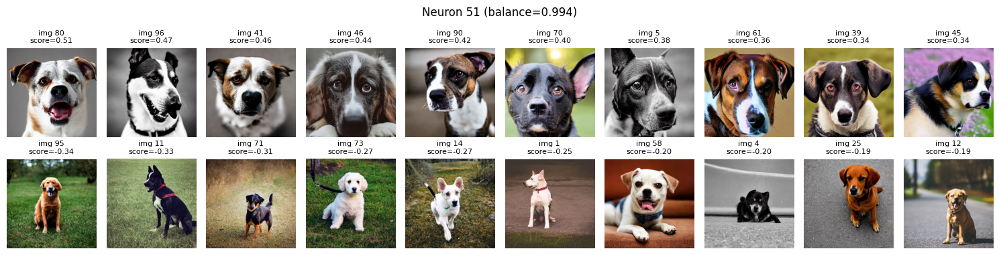

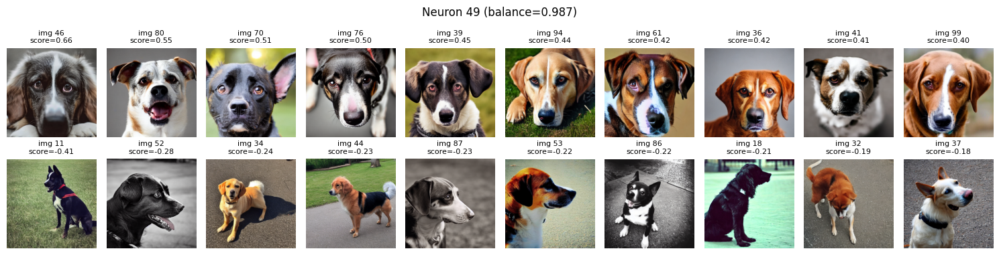

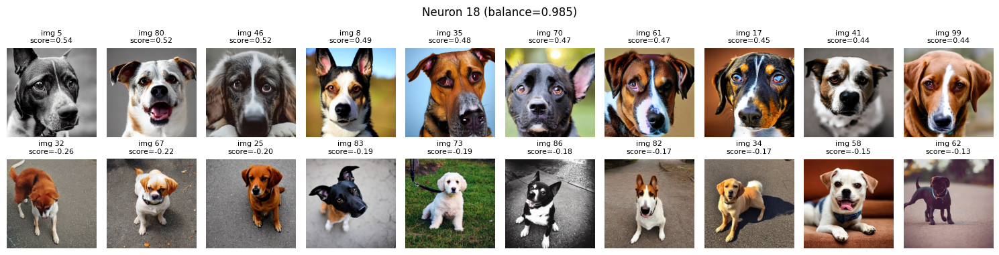

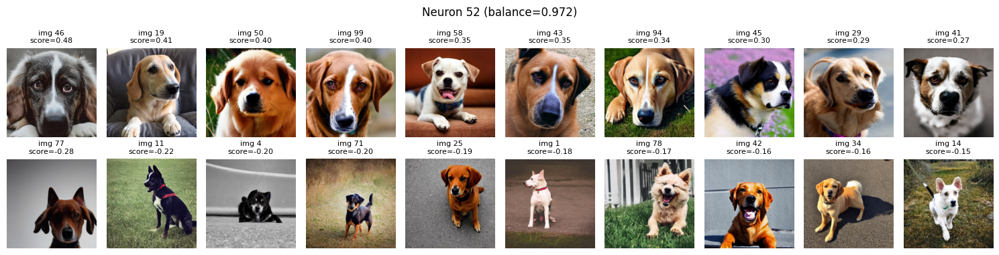

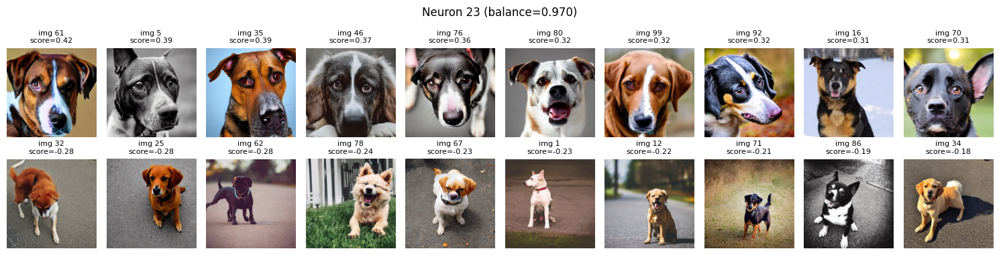

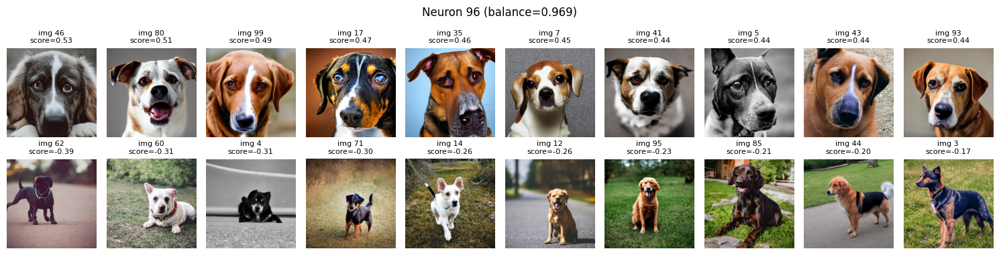

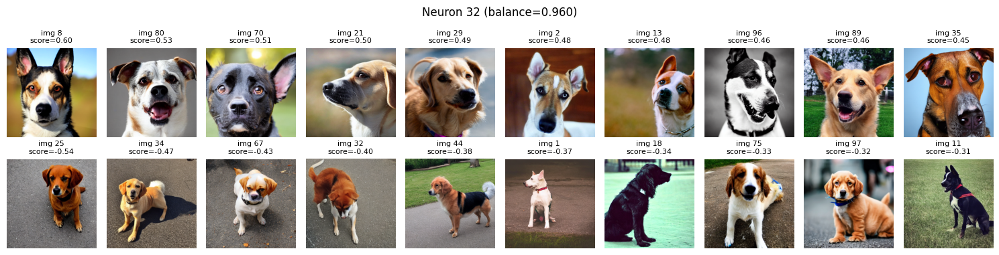

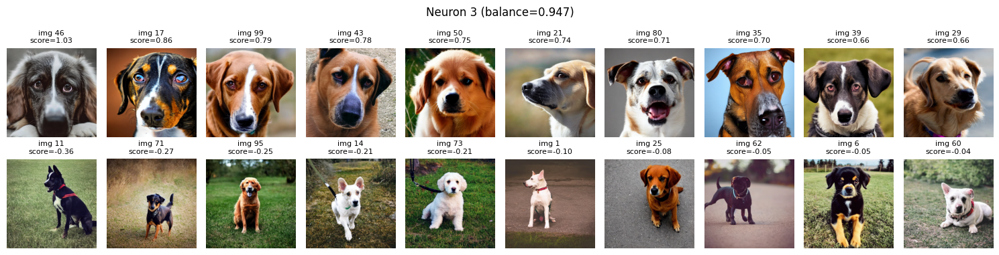

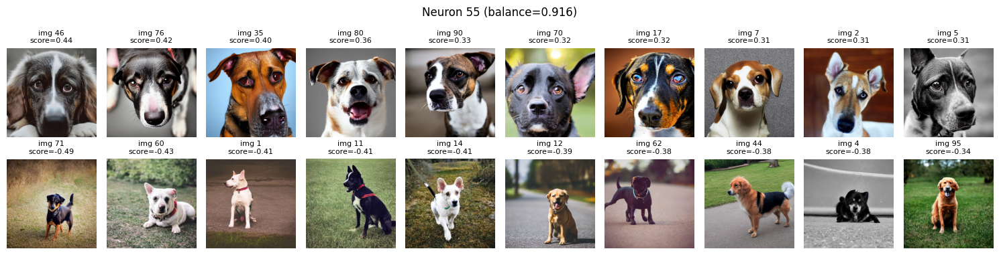

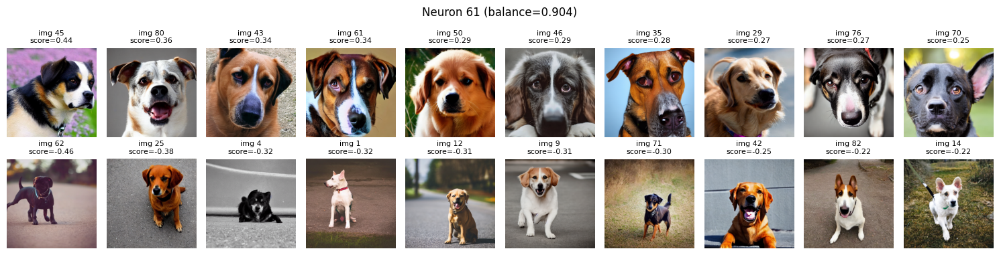

In [40]:
image_idx = np.repeat(np.arange(N), seq_len)  # (N*256,) 각 점이 어느 이미지인지
num = 10

for k in good_neurons:
    dist_k = sd_flat[:, k]  # (N*256,)
    
    # 이미지별 평균 signed distance
    img_scores = np.array([
        dist_k[image_idx == n].mean() for n in range(N)
    ])  # (N,)
    
    # 양수 쪽 top-num, 음수 쪽 top-num
    pos_imgs = np.argsort(img_scores)[::-1][:num]  # signed dist 높은 이미지
    neg_imgs = np.argsort(img_scores)[:num]         # signed dist 낮은 이미지
    
    fig, axes = plt.subplots(2, num, figsize=(15, 4))
    fig.suptitle(f'Neuron {k} (balance={balance_scores[k]:.3f})', fontsize=12)
    
    for col, idx in enumerate(pos_imgs):
        axes[0, col].imshow(images[idx])
        axes[0, col].set_title(f'img {idx}\nscore={img_scores[idx]:.2f}', fontsize=8)
        axes[0, col].axis('off')
    
    for col, idx in enumerate(neg_imgs):
        axes[1, col].imshow(images[idx])
        axes[1, col].set_title(f'img {idx}\nscore={img_scores[idx]:.2f}', fontsize=8)
        axes[1, col].axis('off')

    plt.tight_layout()
    plt.show()
    # break

# 편집 TRY

In [41]:
INJECT_BLOCK = "up_blocks.1"

def _steering_delta_chw(d_np, step_idx, C, H, W):
    d = np.asarray(d_np, dtype=np.float32)
    if d.shape == (C, H, W):
        return d
    if d.ndim == 4 and d.shape[1:] == (C, H, W):
        return d[min(step_idx, d.shape[0] - 1)]
    raise ValueError(f"concept_direction {d.shape}, expected ({C},{H},{W}) or (T,{C},{H},{W})")


def _make_forward_steering_hook(concept_direction, alpha, num_steps):
    d_np = np.asarray(concept_direction, dtype=np.float32)
    step = [0]

    def _hook(_module, _inputs, output):
        out = output[0] if isinstance(output, tuple) else output
        si = step[0]
        step[0] += 1
        _, C, H, W = out.shape
        g = _steering_delta_chw(d_np, si, C, H, W)
        dt = torch.as_tensor(g, device=out.device, dtype=out.dtype)
        alpha_t = alpha * (1.0 - si / max(num_steps - 1, 1))
        new_out = out.clone()
        if new_out.shape[0] >= 2:
            new_out[1] = out[1] + alpha_t * dt
        else:
            new_out = out + alpha_t * dt
        return (new_out,) + tuple(output[1:]) if isinstance(output, tuple) else new_out

    return _hook


def generate_with_concept_direction(prompt, seed, concept_direction, alpha, num_steps=None):
    n_steps = num_steps or NUM_INFERENCE_STEPS
    pipe.scheduler.set_timesteps(n_steps, device=DEVICE)
    actual_steps = len(pipe.scheduler.timesteps)
    blk = get_target_block(pipe.unet, INJECT_BLOCK)
    blk._forward_hooks.clear()
    hook_fn = _make_forward_steering_hook(concept_direction, alpha, actual_steps)
    handle = blk.register_forward_hook(hook_fn)
    try:
        gen = torch.Generator(device="cpu").manual_seed(seed)
        with torch.inference_mode():
            result = pipe(
                prompt=prompt,
                negative_prompt=NEGATIVE_PROMPT,
                num_inference_steps=n_steps,
                guidance_scale=GUIDANCE_SCALE,
                generator=gen,
            )
    finally:
        handle.remove()
    return result.images[0] if hasattr(result, "images") else result["images"][0]

In [42]:
# hyperplane 분할 (102_purple: concept_prompt vs base_prompt 대신)
DB_NEURON = 51  # top-K 리스트 내 인덱스

dist_neuron = signed_dist[:, :, DB_NEURON]  # (N, 256)
pos_token_ratio = (dist_neuron > 0).float().mean(dim=1).cpu().numpy()

concept_indices = np.where(pos_token_ratio > 0.5)[0]   # hyperplane 양쪽 → concept
base_indices = np.where(pos_token_ratio <= 0.5)[0]     # hyperplane 음쪽 → base

In [ ]:
# up_blocks.1 출력 activation 캡처 (concept / base indices, seed = SEED_BASE + image_idx)
CAPTURE_BLOCK = "up_blocks.1"
UP1_SAVE_DIR = Path(f"/project/dam/data/{CONCEPT}/up_blocks_1")
UP1_SAVE_DIR.mkdir(parents=True, exist_ok=True)


def capture_up_blocks1_act_maps(prompt: str, seed: int):
    """한 장 생성 + up_blocks.1 forward마다 cond 출력 (C,H,W) 스택 → (T,C,H,W)."""
    blk = get_target_block(pipe.unet, CAPTURE_BLOCK)
    act_maps = []

    def fwd_hook(_module, _inputs, output):
        out = output[0] if isinstance(output, tuple) else output
        feat = out[1] if out.shape[0] > 1 else out[0]
        act_maps.append(feat.detach().float().cpu().numpy().astype(np.float32))

    handle = blk.register_forward_hook(fwd_hook)
    try:
        gen = torch.Generator(device="cpu").manual_seed(seed)
        with torch.inference_mode():
            result = pipe(
                prompt=prompt,
                negative_prompt=NEGATIVE_PROMPT,
                num_inference_steps=NUM_INFERENCE_STEPS,
                guidance_scale=GUIDANCE_SCALE,
                generator=gen,
            )
    finally:
        handle.remove()

    img = result.images[0] if hasattr(result, "images") else result["images"][0]
    act_tchw = np.stack(act_maps, axis=0)  # (T, C, H, W)
    return img, act_tchw


def capture_split(indices, split_name: str):
    """indices: 원본 dataset image index → seed = SEED_BASE + idx."""
    images_dir = UP1_SAVE_DIR / split_name / "images"
    images_dir.mkdir(parents=True, exist_ok=True)

    act_list, seeds, img_indices = [], [], []
    for idx in tqdm(indices, desc=f"capture {split_name}"):
        idx = int(idx)
        seed = SEED_BASE + idx
        img, act_tchw = capture_up_blocks1_act_maps(PROMPT, seed)
        img.save(images_dir / f"{idx:04d}_seed{seed}.png")
        act_list.append(act_tchw)
        seeds.append(seed)
        img_indices.append(idx)

    act_n_tchw = np.stack(act_list, axis=0).astype(np.float32)  # (N, T, C, H, W)
    out_path = UP1_SAVE_DIR / f"{split_name}_up_blocks_1_act.npz"
    np.savez_compressed(
        out_path,
        act_maps_n_t_h_w=act_n_tchw,
        image_indices=np.array(img_indices, dtype=np.int32),
        seeds=np.array(seeds, dtype=np.int32),
        split=split_name,
        prompt=PROMPT,
        block=CAPTURE_BLOCK,
        seed_base=SEED_BASE,
    )
    print(f"{split_name}: N={len(img_indices)}, act={act_n_tchw.shape} → {out_path}")
    return act_n_tchw, img_indices, seeds

concept_act_up1, concept_idx_saved, concept_seeds = capture_split(concept_indices, "concept")
base_act_up1, base_idx_saved, base_seeds = capture_split(base_indices, "base")

In [151]:
# up_blocks.1 출력 기준 concept_direction
# act_maps_n_t_h_w: (N, T, C, H, W)
concept_direction = np.median(concept_act_up1, axis=0) - np.median(base_act_up1, axis=0)
concept_direction.shape  # (T, C, H, W) e.g. (50, 1280, 32, 32)

(51, 1280, 32, 32)

seed=1000 done
seed=1001 done
seed=1002 done
seed=1003 done
seed=1004 done
seed=1005 done
seed=1006 done
seed=1007 done
seed=1008 done
seed=1009 done


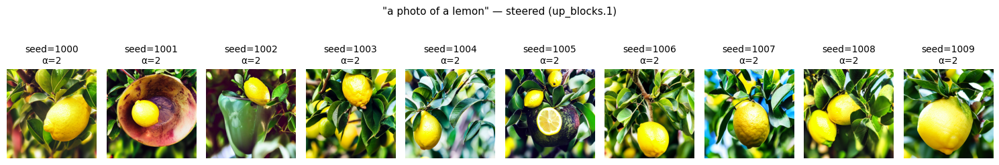

In [166]:
TEST_PROMPT = 'a photo of a lemon'
STEER_SEED_BASE = 1000
NUM_STEER_IMAGES = 10
STEER_ALPHA = 2

steered_imgs = []
for seed in range(STEER_SEED_BASE, STEER_SEED_BASE + NUM_STEER_IMAGES):
    img = generate_with_concept_direction(
        TEST_PROMPT, seed, concept_direction, STEER_ALPHA
    )
    steered_imgs.append((seed, img))
    print(f"seed={seed} done")

n = len(steered_imgs)
ncols = min(n, 10) if n else 1
nrows = (n + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(1.5 * ncols, 3 * nrows))
for ax, (seed, img) in zip(np.atleast_1d(axes).flat, steered_imgs):
    ax.imshow(img)
    ax.set_title(f"seed={seed}\nα={STEER_ALPHA}", fontsize=10)
    ax.axis("off")
for ax in np.atleast_1d(axes).flat[n:]:
    ax.axis("off")
fig.suptitle(f'"{TEST_PROMPT}" — steered ({INJECT_BLOCK})', fontsize=11)
plt.tight_layout()
plt.show()

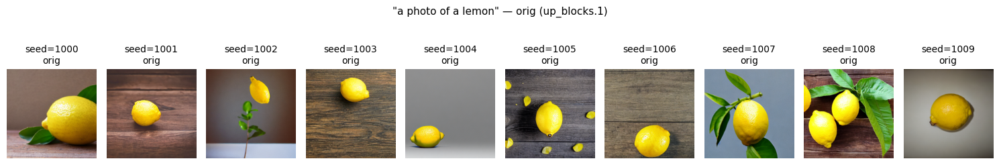

In [167]:
# optional: 원본 vs steered (같은 seed)
orig = generate_with_concept_direction(TEST_PROMPT, STEER_SEED_BASE, np.zeros_like(concept_direction), 0)

n = NUM_STEER_IMAGES
ncols = min(n, 10) if n else 1
nrows = (n + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(1.5 * ncols, 3 * nrows))
for i, ax in enumerate(np.atleast_1d(axes).flat):
    if i < NUM_STEER_IMAGES:
        seed = STEER_SEED_BASE + i
        img = generate_with_concept_direction(TEST_PROMPT, seed, np.zeros_like(concept_direction), 0)
        ax.imshow(img)
        ax.set_title(f"seed={seed}\norig", fontsize=10)
        ax.axis("off")
    else:
        ax.axis("off")
fig.suptitle(f'"{TEST_PROMPT}" — orig ({INJECT_BLOCK})', fontsize=11)
plt.tight_layout()
plt.show()